In [ ]:
!pip -q install torch torchvision matplotlib numpy kaggle diffusers

import os
# Move kaggle.json if present in the current directory
if os.path.exists('kaggle.json'):
    !mkdir -p /root/.config/kaggle
    !mv kaggle.json /root/.config/kaggle/kaggle.json

!chmod 600 /root/.config/kaggle/kaggle.json
!kaggle datasets download -d eduardo4jesus/stanford-cars-dataset

!unzip -q -o stanford-cars-dataset.zip -d stanford_cars

Dataset URL: https://www.kaggle.com/datasets/eduardo4jesus/stanford-cars-dataset
License(s): unknown
100% 1.82G/1.82G [00:04<00:00, 67.1MB/s]
100% 1.82G/1.82G [00:04<00:00, 412MB/s] 


Downloads and show the cars

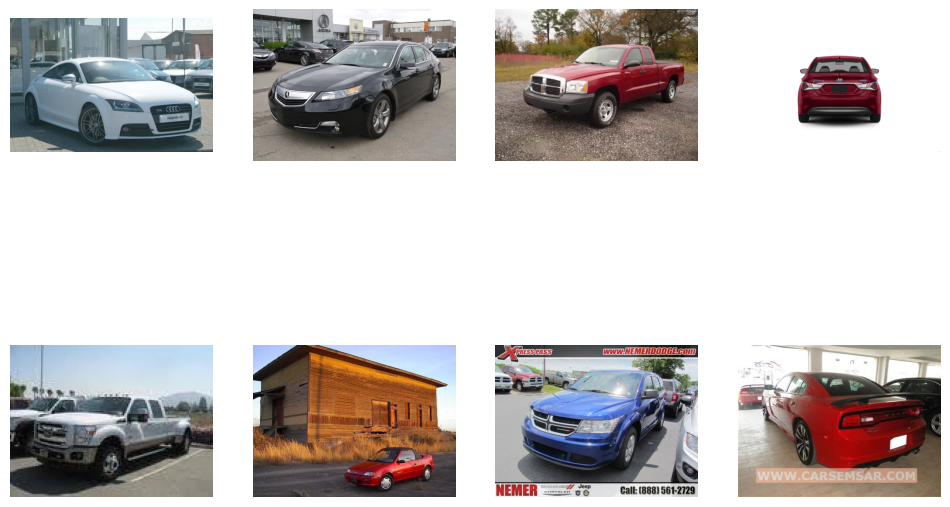

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision import transforms
import torch.nn.functional as F

# Define device globally
device = "cuda" if torch.cuda.is_available() else "cpu"

transform = transforms.ToTensor()

data = torchvision.datasets.ImageFolder(
    root="/content/stanford_cars/cars_train",
    transform=transform
)

def show_images(dataset, num_samples=8):
    plt.figure(figsize=(12, 8))
    for i in range(num_samples):
        img, label = dataset[i]
        plt.subplot(2, 4, i + 1)
        plt.imshow(img.permute(1, 2, 0))  # fix tensor shape for plotting
        plt.axis("off")
    plt.show()

show_images(data)

In [ ]:
from diffusers import DDPMScheduler

# Define the noise scheduler using the diffusers package
T = 300
noise_scheduler = DDPMScheduler(num_train_timesteps=T, beta_start=0.0001, beta_end=0.02)

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    # CHANGED -> point to image folder
    train = torchvision.datasets.ImageFolder(
        root="/content/stanford_cars/cars_train",
        transform=data_transform
    )

    test = torchvision.datasets.ImageFolder(
        root="/content/stanford_cars/cars_test",
        transform=data_transform
    )

    return torch.utils.data.ConcatDataset([train, test])
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

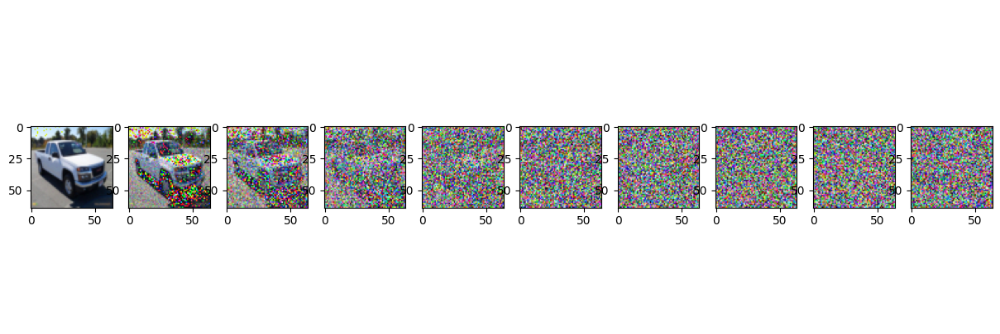

In [ ]:
# Simulate forward diffusion using the diffusers scheduler
image = next(iter(dataloader))[0]

plt.figure(figsize=(15, 5))
plt.axis('off')
num_images = 10
stepsize = int(T / num_images)

for i, idx in enumerate(range(0, T, stepsize)):
    t = torch.tensor([idx])
    plt.subplot(1, num_images, i + 1)

    # Use the scheduler to add noise
    noise = torch.randn_like(image)
    noisy_image = noise_scheduler.add_noise(image, noise, t)

    show_tensor_image(noisy_image)

In [ ]:
from diffusers import UNet2DModel

# Use the prebuilt UNet2DModel from diffusers
model = UNet2DModel(
    sample_size=IMG_SIZE,
    in_channels=3,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(64, 128, 256, 512),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

print("Num params: ", sum(p.numel() for p in model.parameters()))

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Num params:  57892995


In [ ]:
def get_loss(model, x_0, t):
    # Generate noise and add it to the clean images
    noise = torch.randn_like(x_0)
    noisy_images = noise_scheduler.add_noise(x_0, noise, t)

    # Predict the noise using the model
    noise_pred = model(noisy_images, t).sample

    # Standard diffusion loss is MSE between actual and predicted noise
    return F.mse_loss(noise_pred, noise)

In [ ]:
@torch.no_grad()
def sample_plot_image():
    # Start from random noise
    img = torch.randn((1, 3, IMG_SIZE, IMG_SIZE), device=device)

    plt.figure(figsize=(15, 5))
    plt.axis('off')
    num_plots = 10
    stepsize = int(T / num_plots)

    # Initialize timesteps for inference
    noise_scheduler.set_timesteps(T)

    # Loop through the denoising steps
    for i, t in enumerate(noise_scheduler.timesteps):
        # 1. Predict noise residual
        model_output = model(img, t).sample

        # 2. Compute previous image: x_t -> x_t-1
        img = noise_scheduler.step(model_output, t, img).prev_sample

        # Optional: Plotting at intervals
        if i % stepsize == 0:
            plt.subplot(1, num_plots + 1, (i // stepsize) + 1)
            show_tensor_image(img.cpu())

    plt.show()

Epoch 0 | Loss: 1.0984


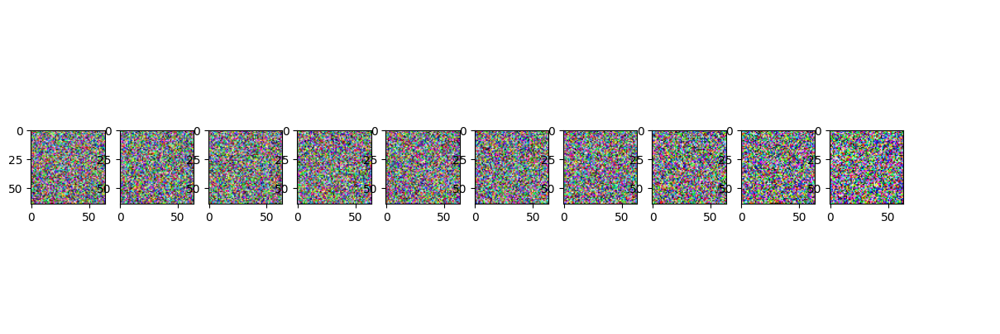

Epoch 1 | Loss: 0.0963


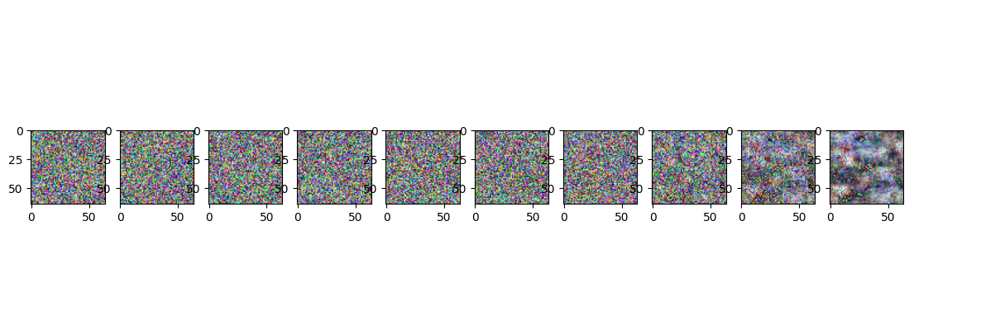

Epoch 2 | Loss: 0.0674


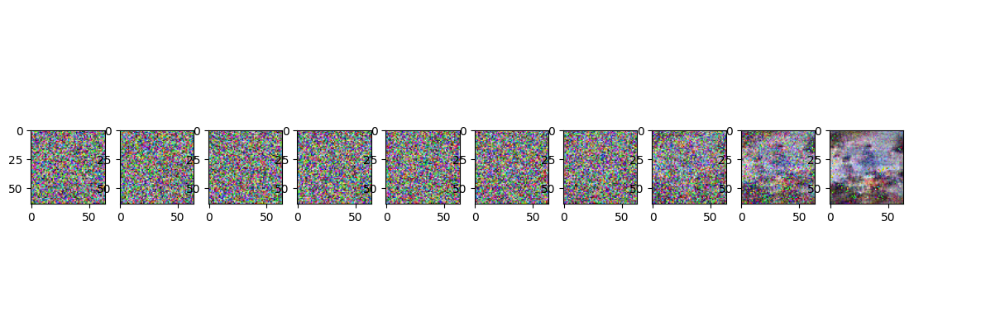

Epoch 3 | Loss: 0.0690


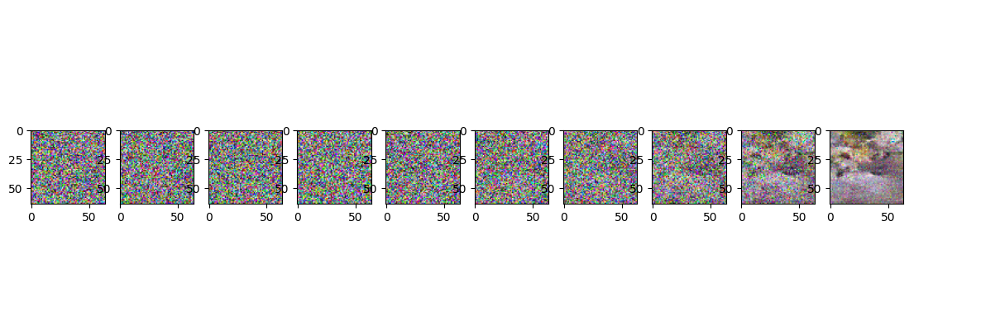

Epoch 4 | Loss: 0.0634


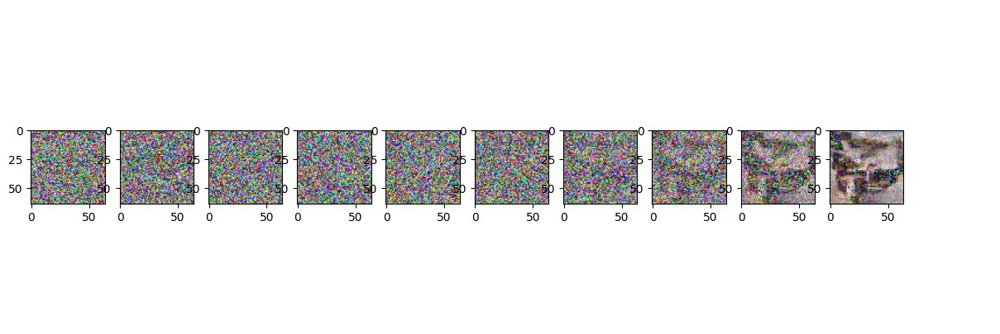

Epoch 5 | Loss: 0.0522


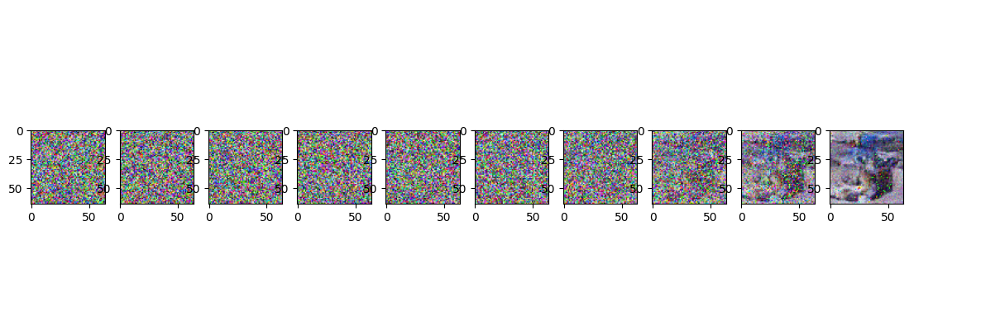

Epoch 6 | Loss: 0.0583


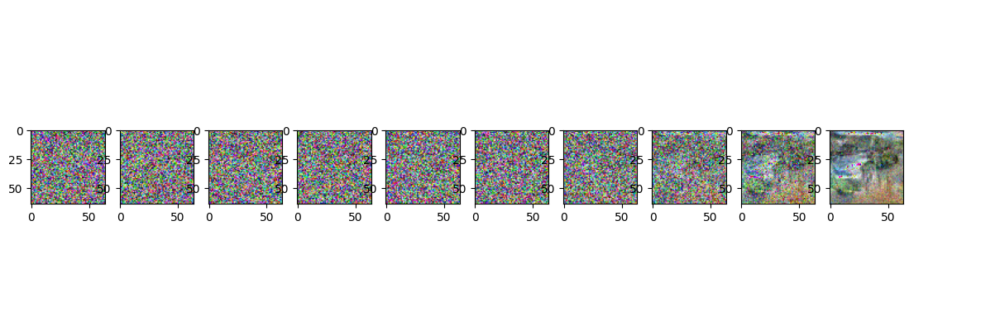

Epoch 7 | Loss: 0.0422


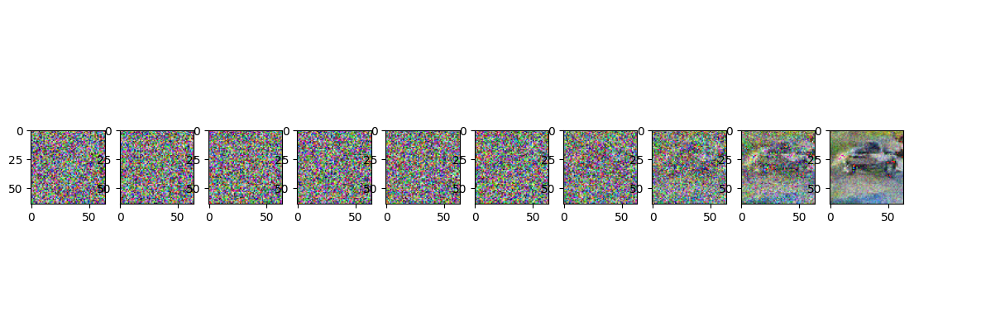

Epoch 8 | Loss: 0.0525


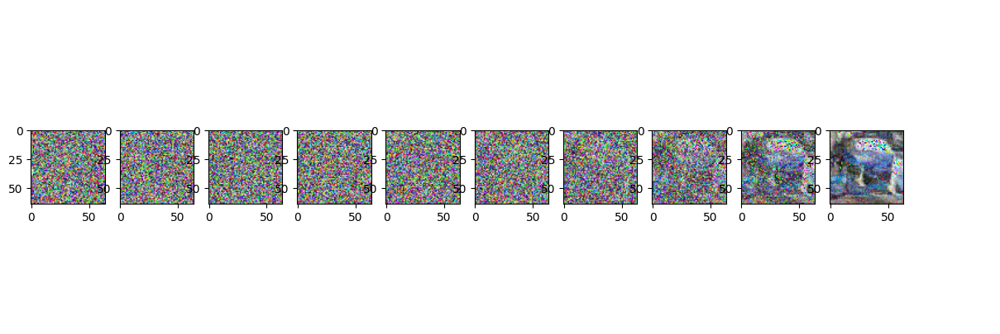

Epoch 9 | Loss: 0.0451


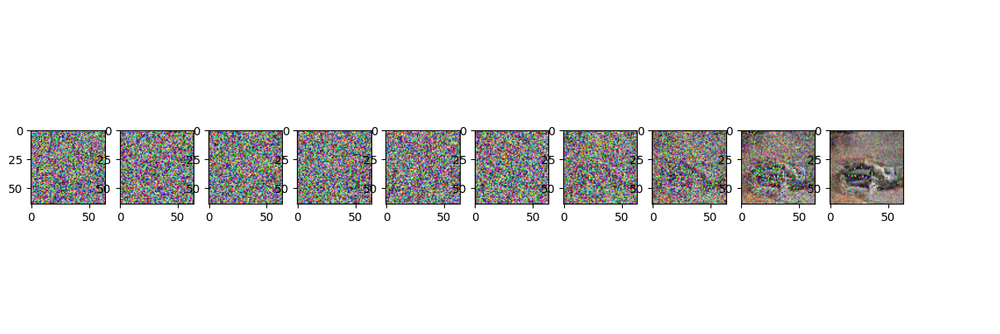

Epoch 10 | Loss: 0.0619


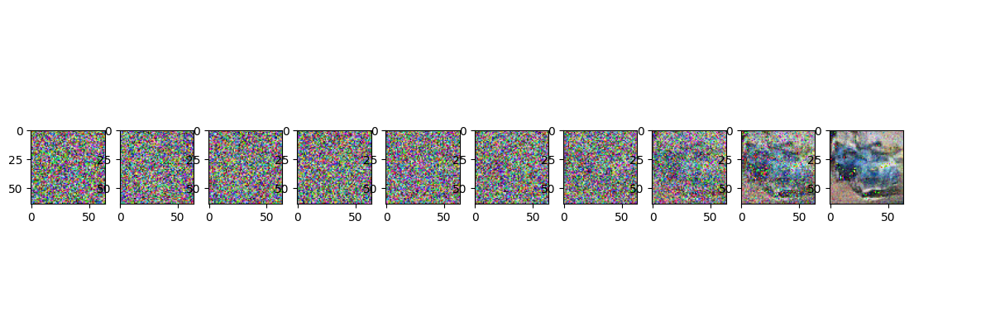

Epoch 11 | Loss: 0.0494


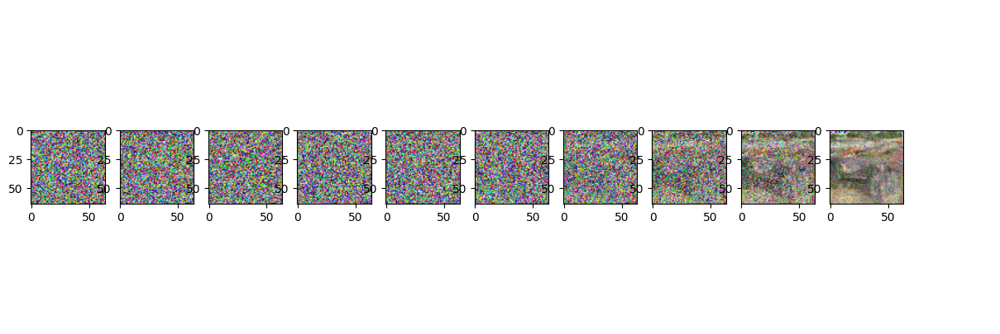

Epoch 12 | Loss: 0.0532


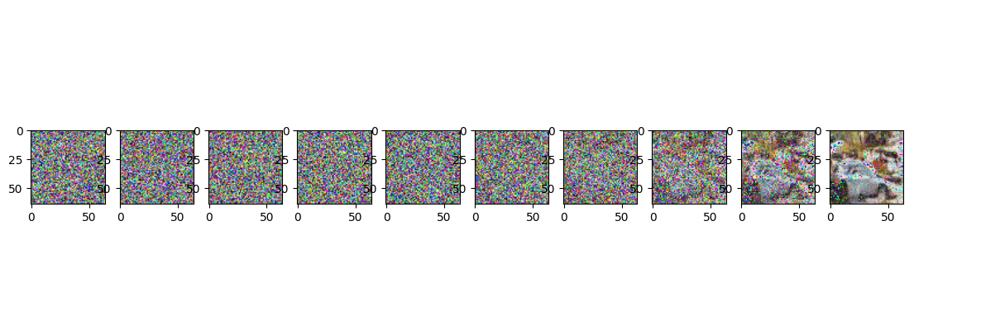

Epoch 13 | Loss: 0.0510


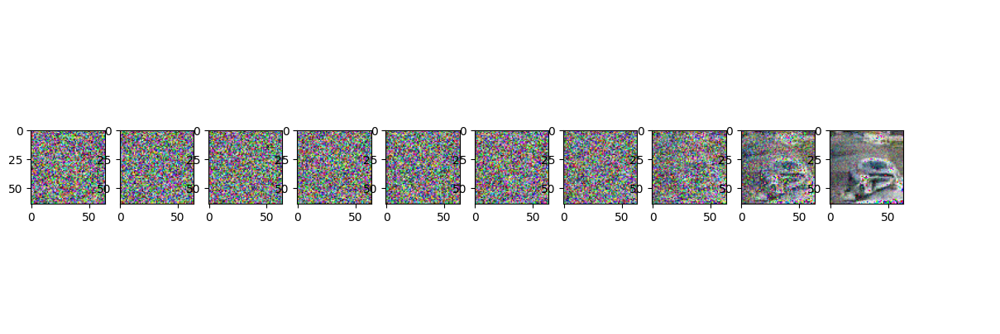

Epoch 14 | Loss: 0.0533


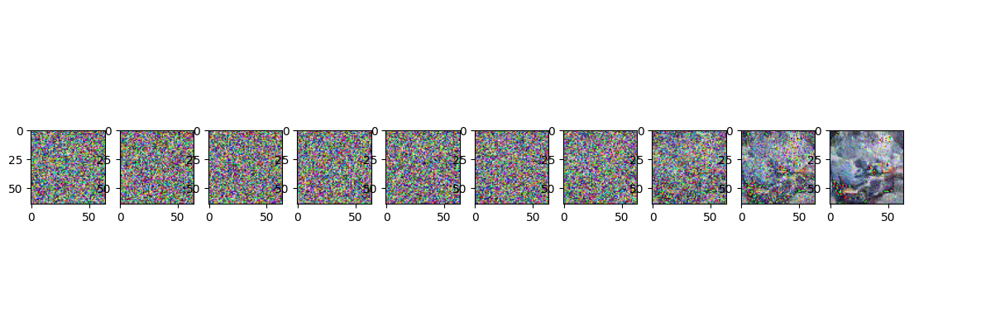

Epoch 15 | Loss: 0.0458


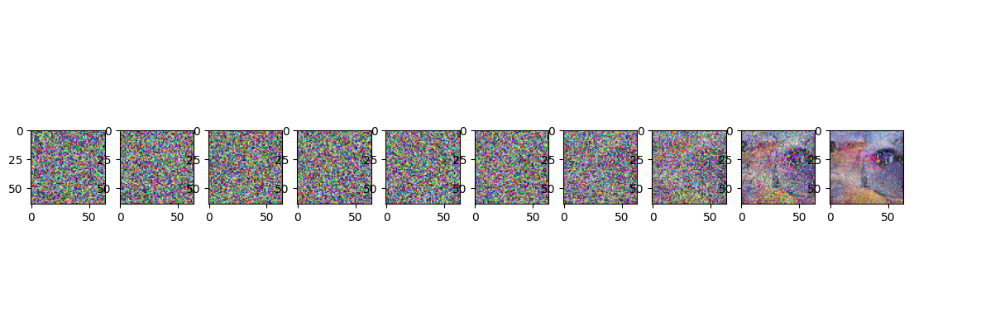

Epoch 16 | Loss: 0.0498


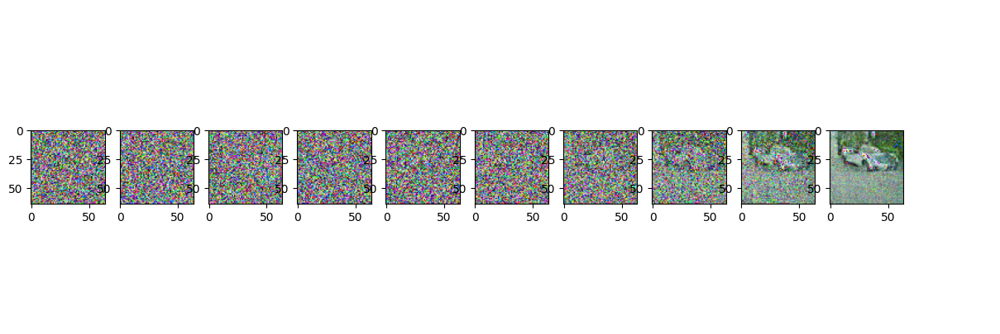

Epoch 17 | Loss: 0.0494


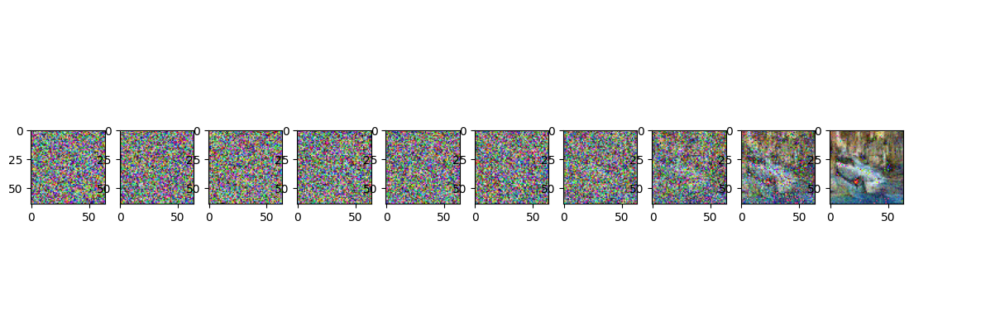

Epoch 18 | Loss: 0.0485


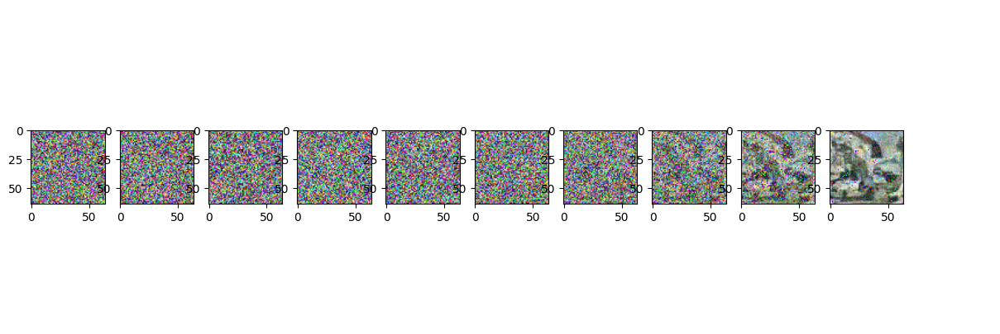

Epoch 19 | Loss: 0.0443


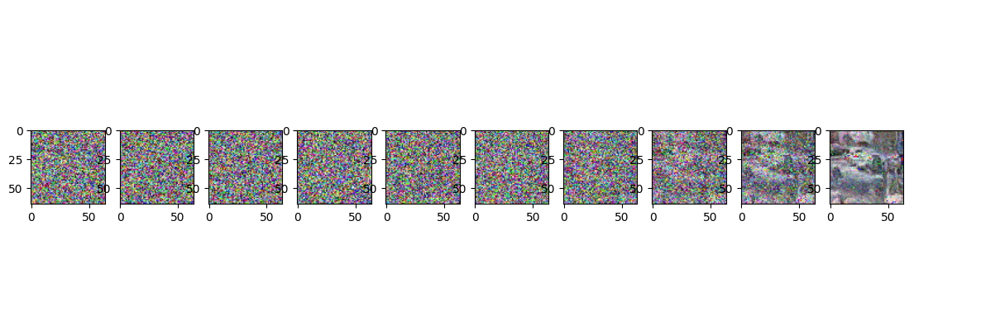

Epoch 20 | Loss: 0.0504


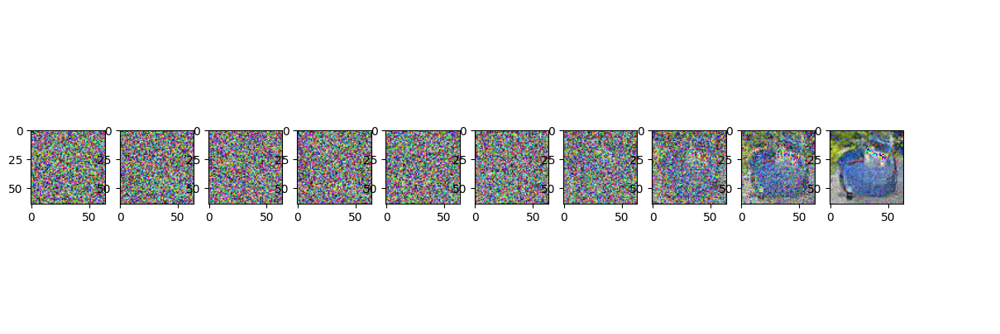

Epoch 21 | Loss: 0.0452


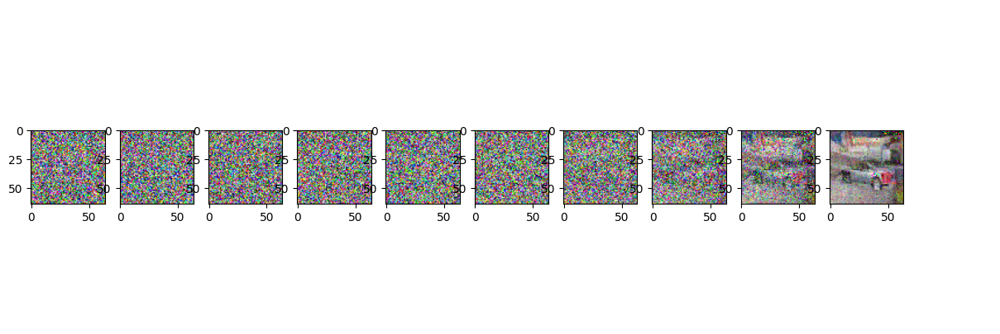

Epoch 22 | Loss: 0.0472


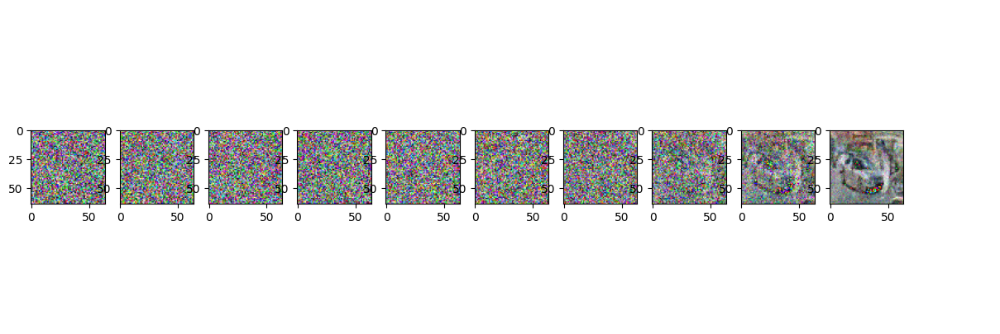

Epoch 23 | Loss: 0.0433


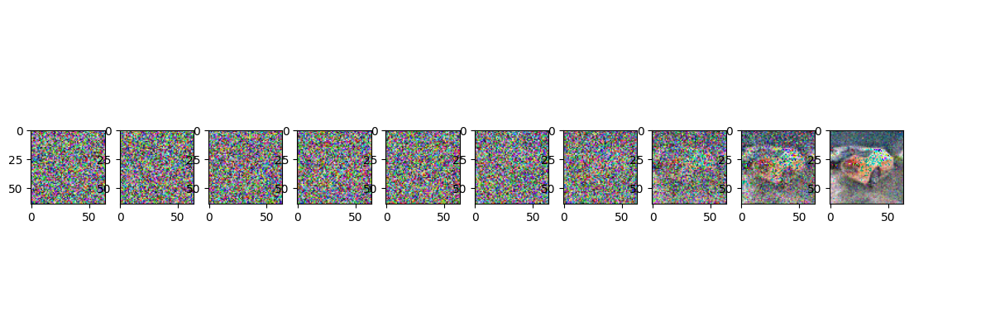

Epoch 24 | Loss: 0.0488


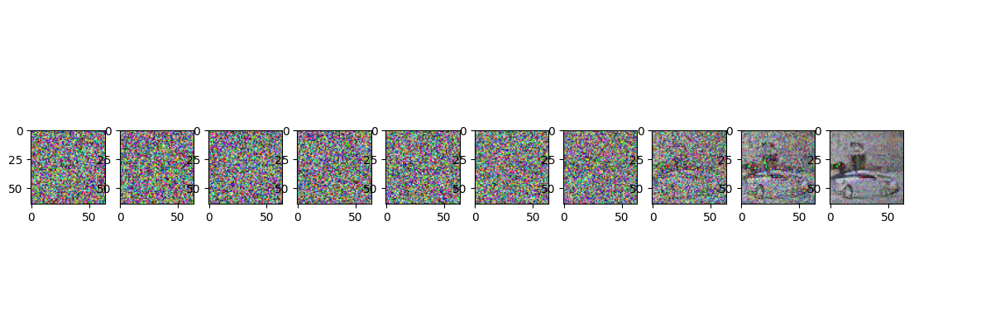

Epoch 25 | Loss: 0.0491


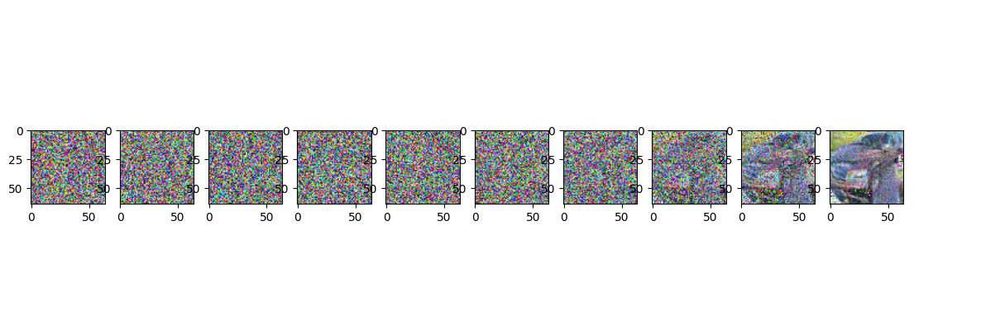

Epoch 26 | Loss: 0.0432


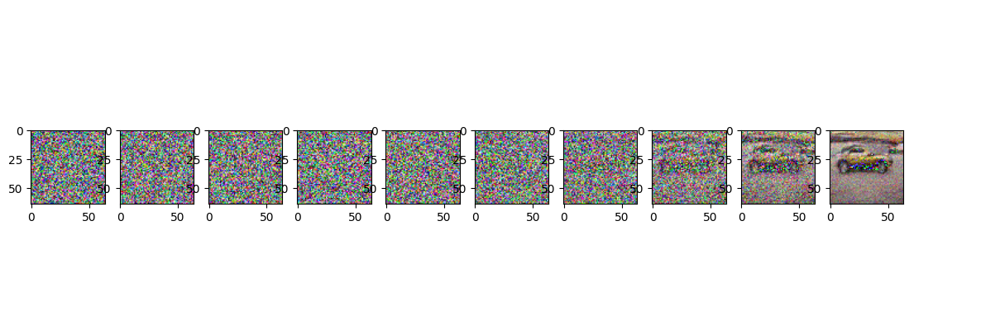

Epoch 27 | Loss: 0.0470


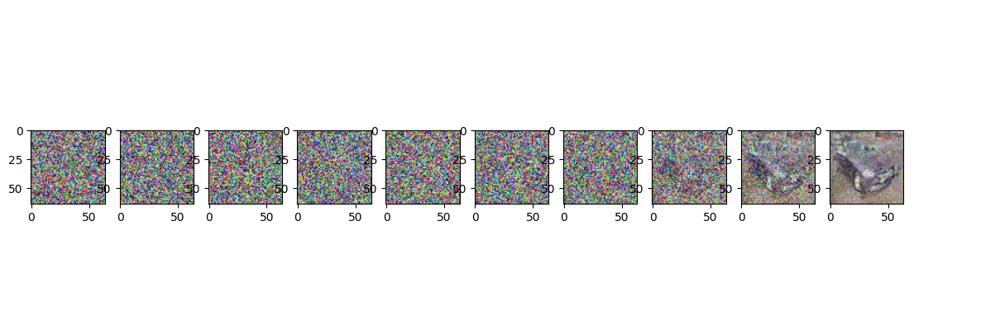

Epoch 28 | Loss: 0.0304


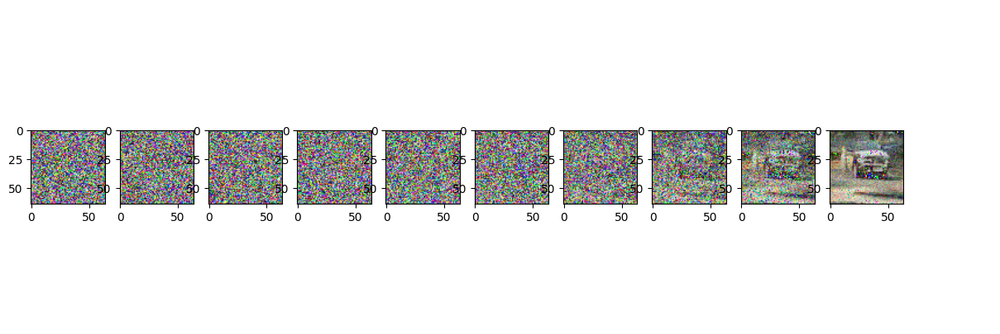

Epoch 29 | Loss: 0.0455


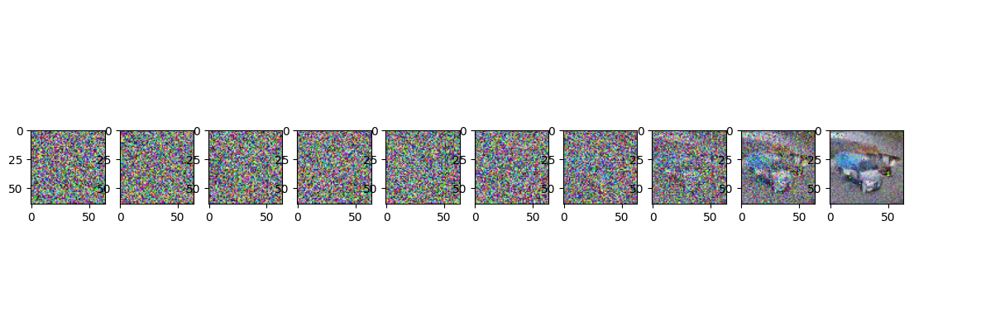

/usr/local/lib/python3.12/dist-packages/debugpy/_vendored/pydevd/_pydevd_bundle/pydevd_safe_repr.py:128: FutureWarning: Accessing config attribute `__iter__` directly via 'UNet2DModel' object attribute is deprecated. Please access '__iter__' over 'UNet2DModel's config object instead, e.g. 'unet.config.__iter__'.
  if not hasattr(obj, "__iter__"):
/usr/local/lib/python3.12/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `__iter__` directly via 'DDPMScheduler' object attribute is deprecated. Please access '__iter__' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.__iter__'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


In [ ]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=1e-4)
epochs = 30

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        clean_images = batch[0].to(device)

        # Sample random timesteps
        t = torch.randint(0, T, (clean_images.shape[0],), device=device).long()

        optimizer.zero_grad()
        loss = get_loss(model, clean_images, t)
        loss.backward()
        optimizer.step()

        if step == 0:
            print(f"Epoch {epoch} | Loss: {loss.item():.4f}")
            # Visualize progress every few epochs
            if epoch % 1 == 0:
                sample_plot_image()